# **Trabajo Práctico N° 1 Aprendizaje Automático II 2025**

### **Redes Densas y Convolucionales**

---
**Alumnos:**


*   **Casado Pedro**

*   **Leguiza Claudia E.**

---



### **PROBLEMA 3**

In [259]:
import subprocess

gpu_info = subprocess.getoutput('nvidia-smi')
if 'failed' in gpu_info or 'not found' in gpu_info:
    print('No se pudo conectar a la GPU')
else:
    print(gpu_info)

Thu May 15 07:38:54 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   78C    P0             34W /   70W |    4254MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## **Librerias**

In [260]:
!pip install visualkeras

In [261]:
!pip install gdown

In [262]:
!pip install tensorflow

In [263]:
import gdown
import zipfile
import tensorflow as tf
from pathlib import Path
import os



In [264]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings("ignore")

In [265]:
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Input, RandomFlip, RandomContrast, RandomTranslation, Flatten, Dropout
from tensorflow.keras.layers import Dense, Conv2D, Activation, MaxPooling2D, GlobalMaxPooling2D, Rescaling
import matplotlib.pyplot as plt
from keras.layers import BatchNormalization
from tensorflow.keras.applications import EfficientNetB0, MobileNetV3Small, MobileNetV3Large
from tensorflow.python.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import visualkeras
from tensorflow.keras.optimizers import Adam
from tensorflow.python.keras.models import load_model, Sequential
from sklearn.metrics import confusion_matrix

In [266]:
# Configurar para que TensorFlow utilice la GPU por defecto
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Configurar para que TensorFlow asigne memoria dinámicamente
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        # Especificar la GPU por defecto
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Manejar error
        print(e)

1 Physical GPUs, 1 Logical GPUs


##**Descarga del Dataset**

In [267]:
#Descargamos el archivo .zip que contiene al dataset
gdown.download('https://drive.google.com/uc?id=1Pqs5Y6dZr4R66Dby5hIUIjPZtBI28rmJ')

Downloading...
From (original): https://drive.google.com/uc?id=1Pqs5Y6dZr4R66Dby5hIUIjPZtBI28rmJ
From (redirected): https://drive.google.com/uc?id=1Pqs5Y6dZr4R66Dby5hIUIjPZtBI28rmJ&confirm=t&uuid=2c24c744-3082-471b-b3f3-549ffd36fb29
To: /content/TP1-3-natural-scenes.zip
100%|██████████| 363M/363M [00:07<00:00, 48.9MB/s]


'TP1-3-natural-scenes.zip'

In [268]:
#Extraemos el zip
with zipfile.ZipFile('TP1-3-natural-scenes.zip', 'r') as zip_ref:
    zip_ref.extractall('./TP1-3')

##**Carga y visualización del dataset**

In [269]:
# Directorio de los datos
TRAIN = Path("/content/TP1-3/seg_train/seg_train")
TEST = Path("/content/TP1-3/seg_test/seg_test")
PRED = Path("/content/TP1-3/seg_pred/seg_pred")

# Tamaño del lote (batch size)
BATCH_SIZE = 32
# Tamaño de las imágenes
IMAGE_HEIGHT = 150
IMAGE_WIDTH = 150

In [270]:
# Carga las imagenes de entrenamiento y validacion
train_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN,
    validation_split=0.2,
    subset="training",
    label_mode="categorical",
    seed=123,
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    batch_size=BATCH_SIZE)

val_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN,
    validation_split=0.2,
    subset="validation",
    label_mode="categorical",
    seed=123,
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    batch_size=BATCH_SIZE)

# Carga las imagenes de test
test_ds= tf.keras.utils.image_dataset_from_directory(
    TEST,
    label_mode="categorical",
    seed=123,
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH))

# Carga las imagenes para prediccion
pred_ds= tf.keras.utils.image_dataset_from_directory(
    PRED,
    label_mode=None,
    seed=123,
    batch_size=BATCH_SIZE,
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH))



Found 14034 files belonging to 6 classes.
Using 11228 files for training.
Found 14034 files belonging to 6 classes.
Using 2806 files for validation.
Found 3000 files belonging to 6 classes.
Found 7301 files.


In [271]:
# Obtiene los nombres de las clases
class_names = train_ds.class_names
num_classes = len(class_names)
print(class_names)

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


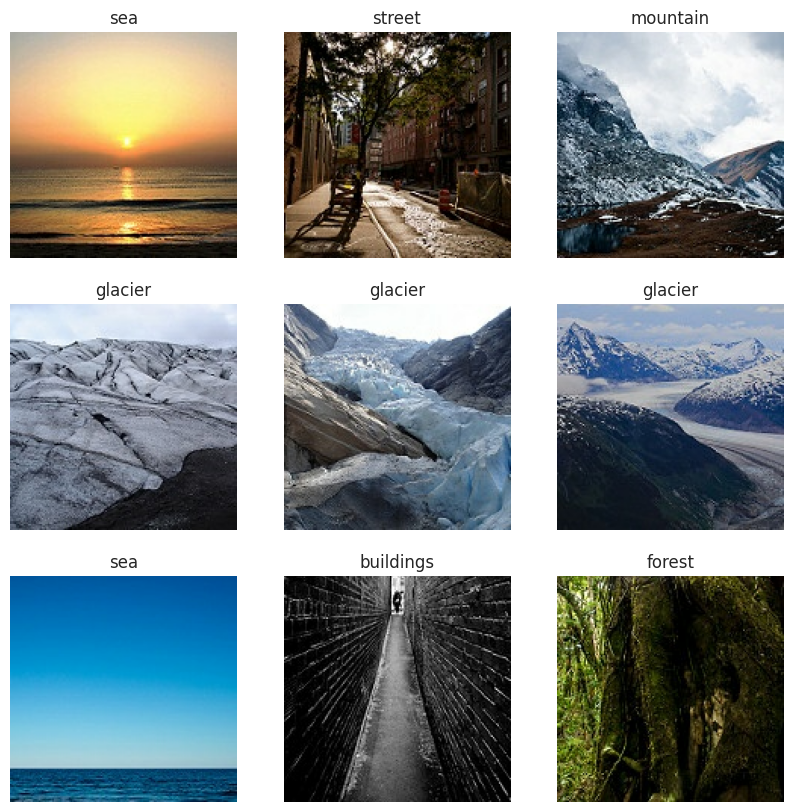

In [272]:
# Muestra algunas imágenes de ejemplo
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    class_idx = list(labels[i]).index(1)
    plt.title(class_names[class_idx])
    plt.axis("off")

In [273]:
# Visualizamos la cantidad de registros por clase en el dataset de TRAIN
class_counts_train = {class_dir.name: len(list(class_dir.glob("*.jpg")))
                      for class_dir in TRAIN.iterdir() if class_dir.is_dir()}

total_train = sum(class_counts_train.values())

df_train = pd.DataFrame(list(class_counts_train.items()),\
                        columns=["Clase", "Cantidad en TRAIN"])
df_train["Frecuencia TRAIN (%)"] = \
                        (df_train["Cantidad en TRAIN"] / total_train) * 100
df_train["Frecuencia TRAIN (%)"] = df_train["Frecuencia TRAIN (%)"].round(2)

print(df_train)

       Clase  Cantidad en TRAIN  Frecuencia TRAIN (%)
0  buildings               2191                 15.61
1        sea               2274                 16.20
2   mountain               2512                 17.90
3     street               2382                 16.97
4     forest               2271                 16.18
5    glacier               2404                 17.13


Consideramos que el dataset tiene clases con un número similar de registros,

 por ende, no será necesario utilizar algun método de balanceo.

##**Optimización para entrenamiento**

In [274]:
#Mantenemos los datos en cache durante el entrenamiento y precargamos el siguiente batch
train_ds= train_ds.cache().shuffle(1000).prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(tf.data.AUTOTUNE)

In [275]:
#Utilizamos el callback EarlyStopping para frenar el entrenamiento tempranamente

early_stopping = EarlyStopping(monitor="val_loss", patience=10, verbose=1,
                                mode="min", restore_best_weights=True)

##**Funciones**

In [276]:
 # Función para graficar la precisión y pérdida del entrenamiento
def graficar_entrenamiento(history):

    acc = history.history.get('accuracy', history.history.get('acc', []))
    val_acc = history.history.get('val_accuracy', history.history.get('val_acc', []))
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(len(loss))

    plt.figure(figsize=(8, 3))

    # Precisión
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title(' Accuracy')

    # Pérdida
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Loss')

    plt.show()

In [277]:
def graficar_confusion_matrix(test_data, modelo):
    predicciones = []
    etiquetas_reales = []

    for imagenes, etiquetas in test_data:
        batch_predic = modelo.predict(imagenes, verbose=False)  # Predicciones por lote
        clases_predic = np.argmax(batch_predic, axis=1)  # Obtener clases predichas
        predicciones.extend(clases_predic)  # Agrega a la lista de predicciones

        clases_reales = np.argmax(etiquetas.numpy(), axis=1)  # Obtener clases reales
        etiquetas_reales.extend(clases_reales)  # Agrega a la lista de etiquetas reales

    predicciones = np.array(predicciones)
    etiquetas_reales = np.array(etiquetas_reales)

    conf_matrix = confusion_matrix(etiquetas_reales, predicciones)

    plt.figure(figsize=(6, 6))
    sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d",
            xticklabels=class_names, yticklabels=class_names)

    plt.xlabel("Predicciones")
    plt.ylabel("Etiquetas reales")
    plt.title("Matriz de Confusión")
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()


In [323]:
def evaluar_test(modelo, test_data):

    test_eval = modelo.evaluate(test_ds, verbose=1)
    df_evaluacion = pd.DataFrame({
             "Conjunto": [ "Test"],
              "Loss": [ test_eval[0]],
              "Accuracy": [ test_eval[1]]
                        })

    print(df_evaluacion)

In [281]:
def visualizar_imagenes_predicciones(modelo, class_names, test_data, show_pred_only=False):
    filas, columnas = 3, 3
    fig, axes = plt.subplots(filas, columnas, figsize=(15, 15))
    axes = axes.ravel()

    plt.subplots_adjust(wspace=0.3, hspace=0.5)  # Espacio entre imágenes

    imagenes, etiquetas = next(iter(test_data))  # Obtener lote de imágenes

    for i in range(min(len(imagenes), len(axes))):
        ax = axes[i]
        ax.imshow(imagenes[i].numpy().astype("uint8"))
        ax.axis('off')

        imagen = tf.expand_dims(imagenes[i], axis=0)
        prediccion = modelo.predict(imagen, verbose=0)
        clase_predic_index = np.argmax(prediccion)
        clase_predic = class_names[clase_predic_index]
        confidence_score = np.max(prediccion)

        clase_actual = class_names[np.argmax(etiquetas[i])]

        title_color = "red" if clase_predic != clase_actual else "black"

        if not show_pred_only:
            ax.set_title(f"Real: {clase_actual}\nPred: {clase_predic} ({confidence_score:.2f})", color=title_color)
        else:
            ax.set_title(f"Pred: {clase_predic} ({confidence_score:.2f})", color=title_color)

    plt.suptitle("Predicciones de imágenes sobre el conjunto de test", y=0.95, fontsize=18)
    plt.show()

In [283]:
def clasificar_imagenes(modelo, class_names, pred_ds):

    filas, columnas = 3, 3
    fig, axes = plt.subplots(filas, columnas, figsize=(15, 15))
    axes = axes.ravel()

    plt.subplots_adjust(wspace=0.3, hspace=0.5)

    # Obtener imágenes desde el dataset
    imagenes = next(iter(pred_ds))

    data_records = []

    for i in range(min(len(imagenes), len(axes))):
        ax = axes[i]
        ax.imshow(imagenes[i].numpy().astype("uint8"))
        ax.axis('off')

        # Expandir la imagen para hacer la predicción
        imagen = tf.expand_dims(imagenes[i], axis=0)
        prediccion = modelo.predict(imagen, verbose=0)
        clase_predic_index = np.argmax(prediccion)
        clase_predic = class_names[clase_predic_index]
        confidence_score = np.max(prediccion)

        # Guardar datos en tabla
        data_records.append({"Índice": i, "Predicción": clase_predic, "Confianza": confidence_score})
        ax.set_title(f"Pred: {clase_predic} ({confidence_score:.2f})")

    plt.suptitle("Clasificación de imágenes sin etiquetas", y=0.95, fontsize=16)
    plt.show()



In [284]:
def guardar_errores_prediccion(modelo, class_names, test_data, archivo_csv="errores_predicciones.csv"):
    imagenes_incorrectas = []

    for imagenes, etiquetas in test_data:
        for i in range(len(imagenes)):
            imagen = tf.expand_dims(imagenes[i], axis=0)  # Expandir dimensiones para la predicción
            prediccion = modelo.predict(imagen, verbose=0)
            clase_predic_index = np.argmax(prediccion)
            clase_predic = class_names[clase_predic_index]
            clase_actual = class_names[np.argmax(etiquetas[i])]

            if clase_predic != clase_actual:

                imagenes_incorrectas.append({
                    "indice_imagen": i,
                    "etiqueta_real": clase_actual,
                    "etiqueta_predicha": clase_predic
                })

    df_errores = pd.DataFrame(imagenes_incorrectas)

    # Guardar en un archivo CSV para análisis posterior
    df_errores.to_csv(archivo_csv, index=False)

    print(f"Se guardaron {len(imagenes_incorrectas)} errores en el archivo '{archivo_csv}'.")


In [286]:
import os
def guardar_errores_prediccion(modelo, class_names, test_data, \
  carpeta_errores="errores_prediccion", archivo_csv="errores_predicciones.csv"):
    # Crear carpeta para imágenes incorrectas si no existe
    if not os.path.exists(carpeta_errores):
        os.makedirs(carpeta_errores)

    imagenes_incorrectas = []

    for imagenes, etiquetas in test_data:
        for i in range(len(imagenes)):
            imagen = tf.expand_dims(imagenes[i], axis=0)  # Expandir dimensiones para la predicción
            prediccion = modelo.predict(imagen, verbose=0)
            clase_predic_index = np.argmax(prediccion)
            clase_predic = class_names[clase_predic_index]
            clase_actual = class_names[np.argmax(etiquetas[i])]

            if clase_predic != clase_actual:

                nombre_archivo = f"{carpeta_errores}/error_{i}_{clase_actual}_vs_{clase_predic}.png"
                plt.imsave(nombre_archivo, imagenes[i].numpy().astype("uint8"))

                imagenes_incorrectas.append({
                    "indice_imagen": i,
                    "ruta_imagen": nombre_archivo,
                    "etiqueta_real": clase_actual,
                    "etiqueta_predicha": clase_predic
                })

    df_errores = pd.DataFrame(imagenes_incorrectas)

    df_errores.to_csv(archivo_csv, index=False)

    print(f"Se guardaron {len(imagenes_incorrectas)} imágenes con errores en '{carpeta_errores}' y los datos en '{archivo_csv}'.")


In [287]:
def visualizar_imagenes_erroneas(indice, df_errores):

  if indice in df_errores.index:
    ruta_imagen = df_errores.loc[indice, "ruta_imagen"]

    if os.path.exists(ruta_imagen):
        imagen = plt.imread(ruta_imagen)
        plt.imshow(imagen)
        plt.title(f"Etiqueta Real: {df_errores.loc[indice, 'etiqueta_real']} | Predicción: {df_errores.loc[indice, 'etiqueta_predicha']}")
        plt.axis("off")
        plt.show()
    else:
        print(f"La imagen '{ruta_imagen}' no existe.")
  else:
    print(f"El índice {indice} no está en el DataFrame.")

# **Modelos**

### Modelo con capas densas

In [288]:
# Función para construir el modelo
def build_dense_model(input_shape, output_labels):
    i = Input(input_shape, dtype=tf.float32)

    #Utilizamos capas de Data Augmentation para que el modelo sea más robusto
    x = Rescaling(1./255)(i)
    x = RandomFlip("horizontal")(x)
    x = RandomFlip("vertical")(x)
    x = RandomTranslation(0.1, 0.1, fill_mode="reflect")(x)
    x = RandomContrast(0.2)(x)

    x = Flatten()(x) # Convierte la imagen en un vector plano

    x = Dense(128)(x)
    x = Activation("relu")(x)
    x = Dropout(0.2)(x)
    x = Dense(64)(x)
    x = Activation("relu")(x)

    x = Dense(output_labels)(x) # Capa de salida para clasificación multiclase
    x = Activation("softmax")(x)

    return tf.keras.Model(inputs=[i], outputs=[x])

 Se eligió una arquitectura sencilla de red neuronal densa con una capa de aumento de datos para mejorar la robustez del modelo, dos capas ocultas de 128 y 64 neuronas respectivamente. La función de activación utilizada en las capas ocultas es ReLU, mientras que en la capa de salida se utilizó Softmax, dado que el problema consiste en una clasificación multiclase de seis categorías.

 Además, se incluyó una capa de Dropout con un ratio de 0.02. Aunque este ratio es bajo, se mantuvo así debido a que mayores tasas afectaban negativamente el rendimiento en el conjunto de validación.

Conversión a valores normalizados (Rescaling), lo cual es una práctica recomendada.





In [289]:
#Creamos el modelo
dense_model = build_dense_model((IMAGE_HEIGHT, IMAGE_WIDTH, 3), num_classes)

In [290]:
dense_model.summary()#verificamos que la arquitectura sea la correcta antes de entrenar

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_9 (Rescaling)         │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_10 (RandomFlip)     │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_11 (RandomFlip)     │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_translation_5            │ (None, 150, 150, 3)    │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_5               │ (None, 150, 150, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 67500)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │     8,640,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_35 (Activation)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_36 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 6)              │           390 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_37 (Activation)      │ (None, 6)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,648,774 (32.99 MB)

 Trainable params: 8,648,774 (32.99 MB)

 Non-trainable params: 0 (0.00 B)

In [291]:
# Configurar el optimizador con la tasa de aprendizaje
optimizer = Adam(learning_rate=1e-4)

# Compilar el modelo
dense_model.compile(optimizer=optimizer,
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])

# Definir número de épocas
EPOCHS = 200


*** Adam (Adaptive Moment Estimation) como optimizador***
- Combina lo mejor de SGD con momentum y RMSProp, permitiendo ajustes adaptativos en la tasa de aprendizaje.
- Se adapta automáticamente a cada parámetro del modelo, lo que es útil en datasets con alta complejidad.
- Funciona bien en problemas de clasificación de imágenes, especialmente cuando hay muchas clases.

*** Categorical Crossentropy como función de costo***
- Ideal cuando el problema es clasificación multiclase y cada muestra pertenece a una única clase.
- Penaliza más los errores en la predicción de la clase correcta, lo que ayuda a mejorar la precisión de clasificación.
- Genera probabilidades más precisas en la salida de la red neuronal cuando se usa junto con softmax.

In [292]:
# Entrena el modelo
history_dense = dense_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[early_stopping]
)

Epoch 1/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.2957 - loss: 1.8031 - val_accuracy: 0.4576 - val_loss: 1.3897
Epoch 2/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.3847 - loss: 1.4959 - val_accuracy: 0.4743 - val_loss: 1.3272
Epoch 3/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.4043 - loss: 1.4437 - val_accuracy: 0.4758 - val_loss: 1.3479
Epoch 4/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.4262 - loss: 1.4145 - val_accuracy: 0.4843 - val_loss: 1.3043
Epoch 5/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.4354 - loss: 1.4083 - val_accuracy: 0.4736 - val_loss: 1.3252
Epoch 6/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.4383 - loss: 1.4124 - val_accuracy: 0.4751 - val_loss: 1.3337
Epoch 7/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.4326 - loss: 1.4130 - val_accuracy: 0.4932 - val_loss: 1.2840
Epoch 8/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.4431 - loss: 1.3939 - 

## Evaluacion del modelo

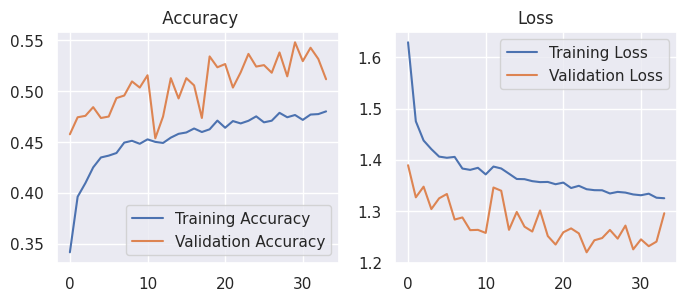

In [293]:
graficar_entrenamiento(history_dense)

**Evolución de la perdida y precisión:** En los gráficos se puede ver como el accuracy de train va a aumentando suvemente hasta estabilizarse en alredeor de 0.47 y  el de validación con un poco más de ruido llega una precision de 0.51. Esto se debe al aumento de datos aplicado en el set de train que permite al modelo generalizar mejor en validacion por ser menos complejas las imagenes.
La perdida es de 1.33 para train y 1.29 para validacion.

In [324]:
evaluar_test(dense_model,test_ds)

94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5051 - loss: 1.2652
  Conjunto      Loss  Accuracy
0     Test  1.260992  0.513333


**Pruebas con diferentes arquitecturas:** Se experimento con varias extructuras. Se logro el mejor rendimiento con una capa oculta de 513 neuronas pero la cantidad de parametros a entrenar se elevaba considerablemte.
Con  tres capas ocultas de 64, 32, 16 la precision disminuia considerablemente. La estructura elegida logro la mejor performance con una cantidad de parametros  que no comprometio el rendimieno computacional.

**Callback de Early Stopping:** Se añadió un callback de Early Stopping, configurado para detener el entrenamiento si no se observaba una mejora en la precisión de validación en un número determinado de iteraciones.

**Resultados obtenidos:** El modelo logró una precisión del 51%, lo que indica que no fue capaz de aprender adecuadamente los patrones del conjunto de datos. Esto es consistente con las limitaciones de una red densa para procesar información espacial compleja.

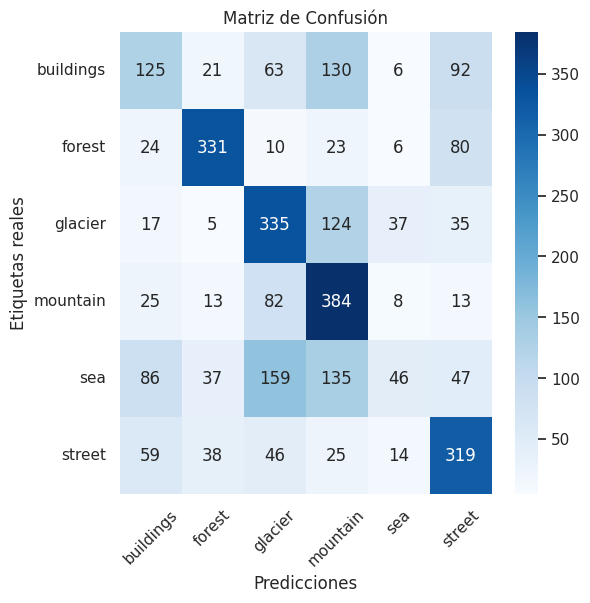

In [295]:
graficar_confusion_matrix(test_ds, dense_model)

En la matriz de confusion observamos que:


*   las imágenes de la clase buildings son erroneamente etiquetadas principalmente como mountain, street o glacier.
*   las imágenes de la clase sea son erroneamnete etiquetadas mayormente como glacier y mountain.


*   las imágenes de la clase glacier son erroneamente etiquetadas como mountain.
*   y por ultimo, en menor medida, las imágenes de la clase street son catalogadas como buildings





In [296]:
guardar_errores_prediccion(dense_model, class_names, test_ds,\
                           carpeta_errores="dense_imagenes",\
                           archivo_csv="dense_errores.csv")



Se guardaron 1460 imágenes con errores en 'dense_imagenes' y los datos en 'dense_errores.csv'.


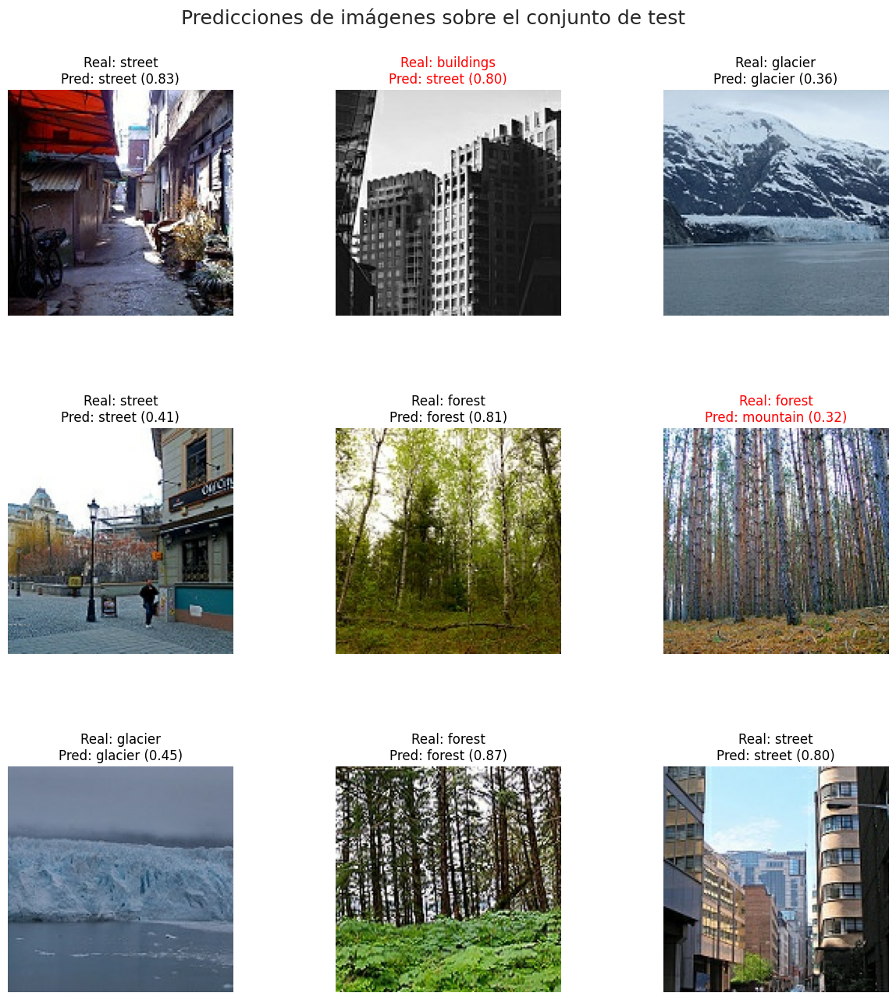

In [297]:
visualizar_imagenes_predicciones(dense_model, class_names, test_ds, show_pred_only=False)

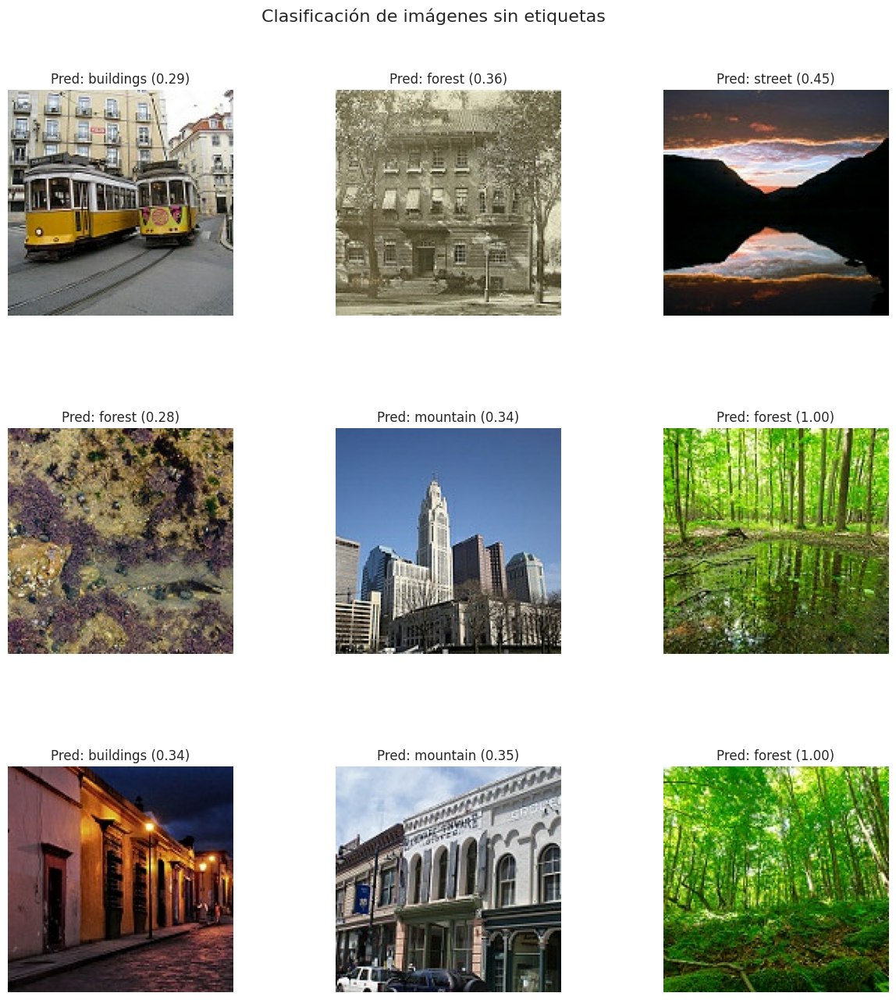

In [298]:
clasificar_imagenes(dense_model, class_names, pred_ds)

### Modelo con capas convolucionales y densas

In [44]:
# Función para construir el modelo
def build_cnn_model(input_shape, output_labels):
    i = Input(input_shape, dtype=tf.float32)

    x = Rescaling(1./255)(i)

    x = Conv2D(8, (3, 3))(x)
    x = Activation("relu")(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(16, (3, 3))(x)
    x = Activation("relu")(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(32, (3, 3))(x)
    x = Activation("relu")(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(64, (3, 3))(x)
    x = Activation("relu")(x)
    x = MaxPooling2D((2, 2))(x)

    x = Flatten()(x) # Convierte la imagen en un vector plano

    x =Dropout(0.2)(x)
    x = Dense(32)(x)
    x = Activation("relu")(x)

    x = Dense(output_labels)(x) # Capa de salida para clasificación multiclase
    x = Activation("softmax")(x)
    return tf.keras.Model(inputs=[i], outputs=[x])

**Estructura**: La normalización ayuda al modelo a aprender mejor sin depender de los valores de píxel originales.

Contiene tres capas convolucionales, cada bloque contiene:
- Conv2D(filters, kernel_size): Extrae patrones clave de la imagen.
- Activation("relu"): Activa las neuronas de manera no lineal para mejorar el aprendizaje.
- MaxPooling2D(pool_size=(2, 2)): Reduce la dimensionalidad de la imagen sin perder información relevante.

- Cada capa convolucional aumenta la profundidad: La primera tiene 8 filtros, la última 64 filtros, aumentando la capacidad de reconocimiento de detalles.
- Cada capa aplica MaxPooling2D() para reducir el tamaño de la imagen progresivamente.
- Después de extraer características, la imagen se convierte en un vector plano (Flatten()), y se pasa a capas densas para la clasificación
- La capa Dropout(0.2) ayuda a reducir el sobreajuste.
- La capa Dense(32) procesa las características extraídas por las convoluciones.
- Dense(output_labels): Define el número de clases que el modelo debe predecir.
- Softmax: Asigna una probabilidad a cada clase, útil para clasificación multiclase




In [45]:
cnn_model = build_cnn_model((IMAGE_HEIGHT, IMAGE_WIDTH, 3), num_classes)
# Configurar el optimizador con la tasa de aprendizaje
optimizer = Adam(learning_rate=1e-4)

# Compilar el modelo
cnn_model.compile(optimizer=optimizer,
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])

# Definir número de épocas
EPOCHS = 200


In [46]:
cnn_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 148, 148, 8)    │           224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 148, 148, 8)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 16)     │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 72, 72, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 34, 34, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_6 (Activation)       │ (None, 15, 15, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 3136)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 3136)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │       100,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_7 (Activation)       │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 6)              │           198 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_8 (Activation)       │ (None, 6)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 125,110 (488.71 KB)

 Trainable params: 125,110 (488.71 KB)

 Non-trainable params: 0 (0.00 B)

Este modelo con esta estructura tiene un total de parametros entrenables de 125110 significativamente menor al modelo anterior de 8648774

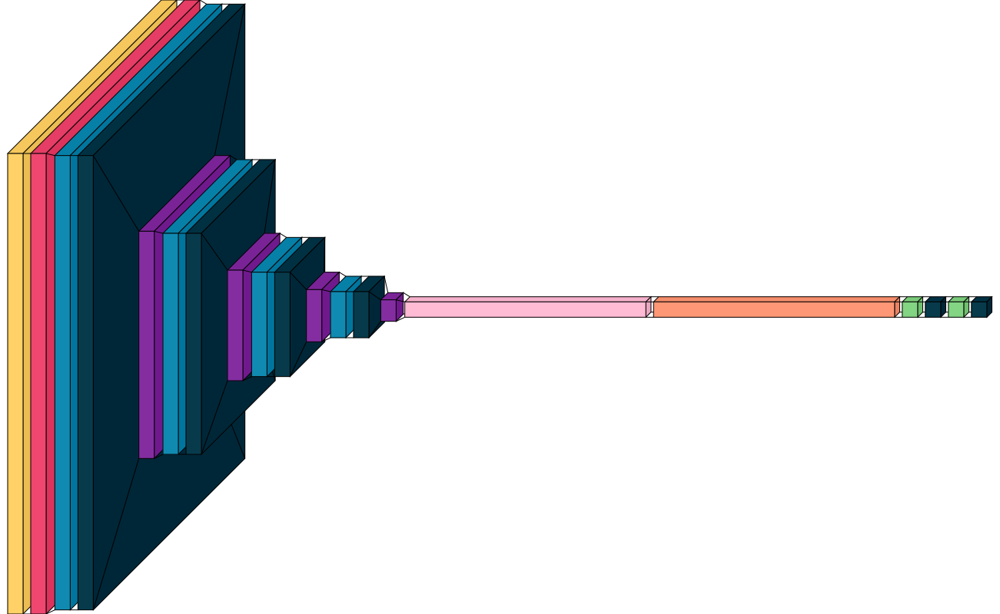

In [47]:
visualkeras.layered_view(cnn_model)

In [48]:
# Entrenamos el modelo
history = cnn_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[early_stopping]
)

Epoch 1/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 12s 19ms/step - accuracy: 0.3671 - loss: 1.5425 - val_accuracy: 0.5909 - val_loss: 1.0766
Epoch 2/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5756 - loss: 1.0916 - val_accuracy: 0.6269 - val_loss: 0.9661
Epoch 3/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6334 - loss: 0.9703 - val_accuracy: 0.6803 - val_loss: 0.8814
Epoch 4/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6722 - loss: 0.8918 - val_accuracy: 0.6946 - val_loss: 0.8395
Epoch 5/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6848 - loss: 0.8503 - val_accuracy: 0.6746 - val_loss: 0.9082
Epoch 6/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6927 - loss: 0.8245 - val_accuracy: 0.7224 - val_loss: 0.7783
Epoch 7/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.7046 - loss: 0.7994 - val_accuracy: 0.7292 - val_loss: 0.7478
Epoch 8/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.7205 - loss: 0.7554 - val_ac

### Evaluacion del modelo

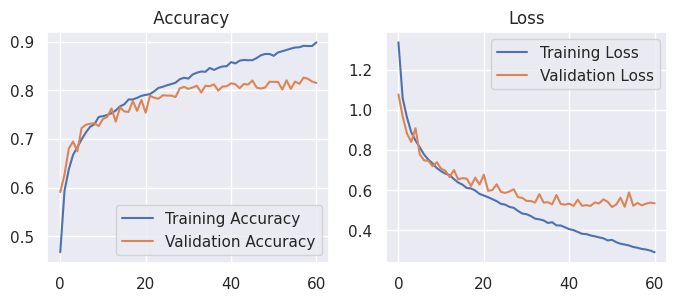

In [49]:
graficar_entrenamiento(history)

In [325]:
evaluar_test(cnn_model,  test_ds)

94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8089 - loss: 0.5550
  Conjunto      Loss  Accuracy
0     Test  0.554878     0.809


**Callback de Early Stopping**: Se implementó un callback de Early Stopping para interrumpir el entrenamiento si la precisión de validación no mejoraba tras 10 épocas. Esto permitió evitar el sobreentrenamiento y reducir el tiempo.

**Resultados obtenidos:** El diseño logró una precisión adecuada, precision de 80% en test y una perdida de 0.55.

No se aplico aumento de datos.
En los graficos observamos que la precision de train fue de 90% y en validacion de 81% con un leve ruido y la perdida fue de 0.28 en train y 0.53 en validacion, logrando esta performance en 61 epocas.

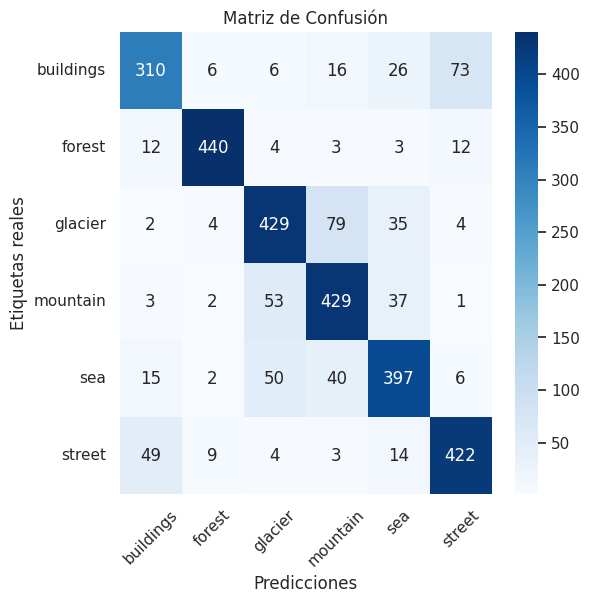

In [51]:
graficar_confusion_matrix(test_ds, cnn_model)

La detección de clases es generalmente buena, teniendo un menor desempeño en:


*   las clases buildings y street
*   las clases glacier y sea


*   las clases sea y mountain
*   las clases glacier y mountain


In [181]:
guardar_errores_prediccion(cnn_model, class_names, test_ds,\
                           carpeta_errores="cnn_imagenes",\
                           archivo_csv="errores_cnn_model.csv")


Se guardaron 573 imágenes con errores en 'cnn_imagenes' y los datos en 'errores_cnn_model.csv'.


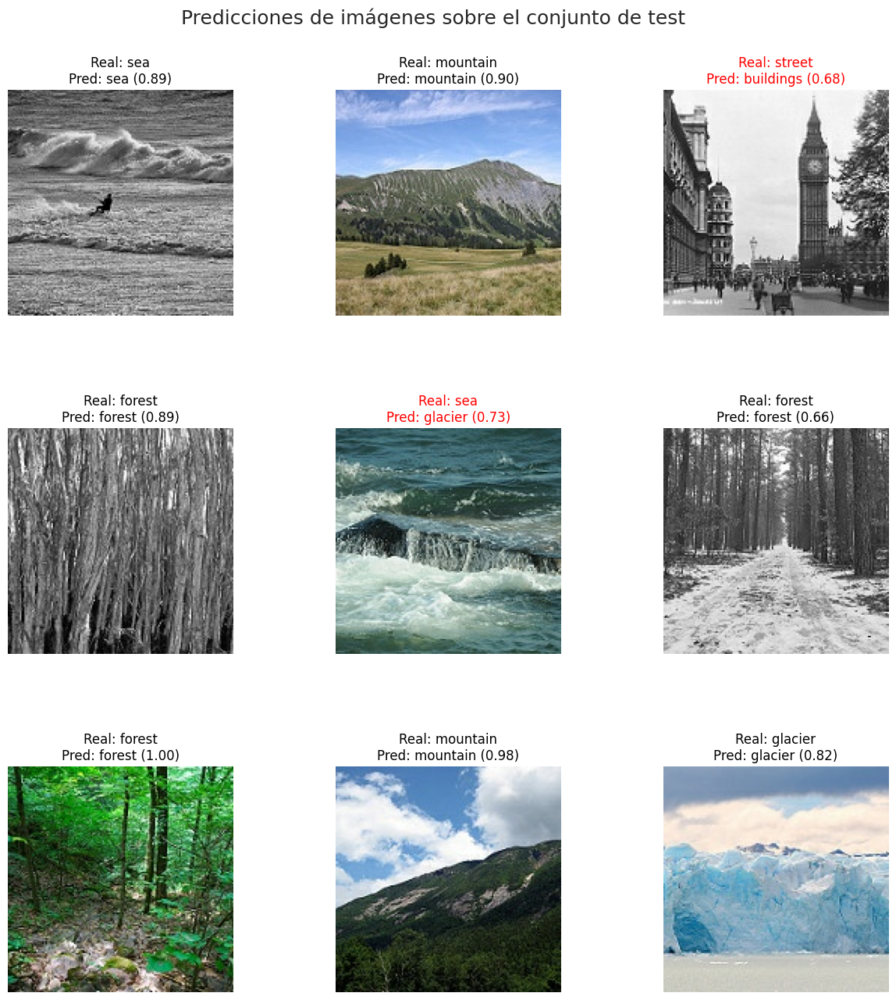

In [53]:
visualizar_imagenes_predicciones(cnn_model, class_names, test_ds, show_pred_only=False)

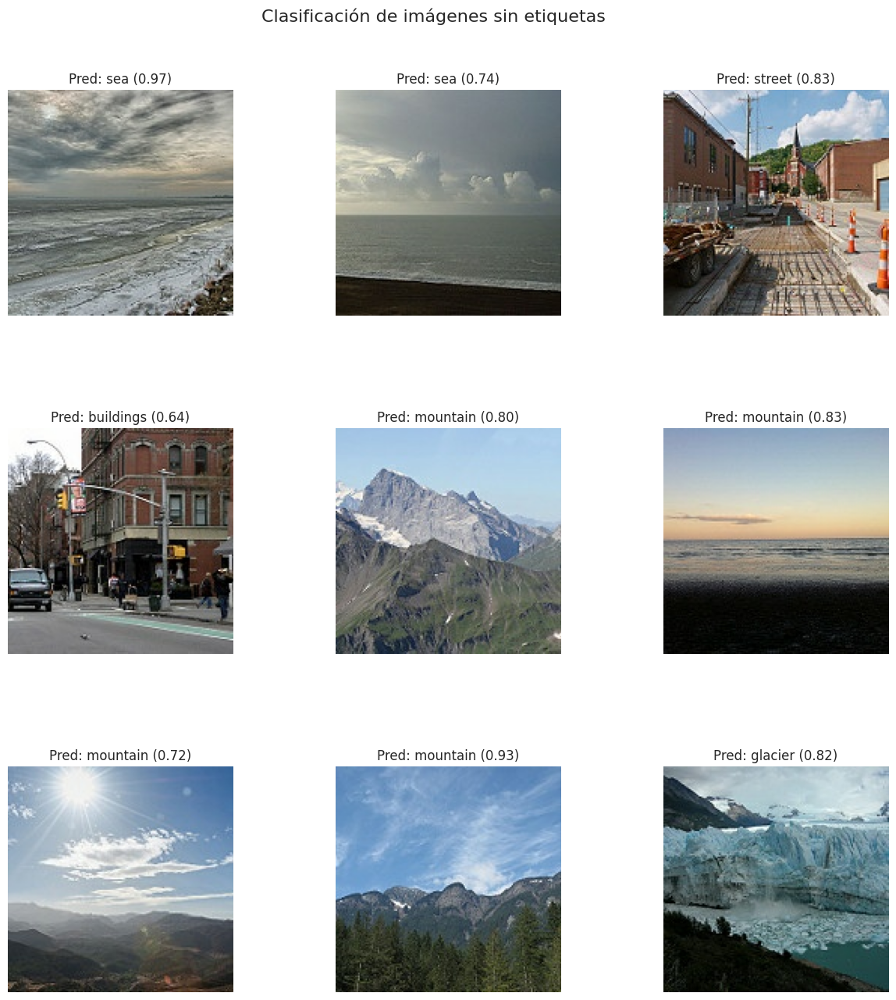

In [54]:
clasificar_imagenes(cnn_model, class_names, pred_ds)

### Modelo con bloques residuales

In [55]:
def residual_block(x, filters):
    res = layers.Conv2D(filters, (3,3), padding="same", use_bias=False)(x)
    res = BatchNormalization()(res)
    res = layers.Activation("relu")(res)

    res = layers.Conv2D(filters, (3,3), padding="same", use_bias=False)(res)
    res = BatchNormalization()(res)

    shortcut = layers.Conv2D(filters, (1,1), padding="same", use_bias=False)(x)
    shortcut = BatchNormalization()(shortcut)

    x = layers.Add()([shortcut, res])
    x = layers.Activation("relu")(x)

    return x

**Estructura del bloque residual:**
- Primera capa convolucional (Conv2D(filters, (3,3))): Aprende características y aplica BatchNormalization().
- Segunda capa convolucional (Conv2D(filters, (3,3))):Refina las características extraídas.
- Shortcut (Conv2D(filters, (1,1))): Se usa para igualar dimensiones cuando x tiene diferente cantidad de filtros.
- Suma residual (Add()) : Combina la entrada original (shortcut) con el resultado (res).
- Activación final Relu


In [56]:
def build_res_model(input_shape, num_classes):
    i = layers.Input(shape=input_shape)

    x = Rescaling(1./255)(i)
    x = RandomFlip("horizontal")(x)
    x = RandomFlip("vertical")(x)
    x = RandomTranslation(0.1, 0.1, fill_mode="reflect")(x)
    x = RandomContrast(0.2)(x)

    x = layers.Conv2D(32, (3,3), activation="relu", padding="same", use_bias=False)(i)
    x = BatchNormalization()(x)

    x = residual_block(x, 32)
    x = layers.MaxPooling2D(2,2)(x)

    x = residual_block(x, 64)
    x = layers.MaxPooling2D(2,2)(x)

    x = residual_block(x, 128)
    x = layers.GlobalAveragePooling2D()(x)

    x = layers.Dense(num_classes, activation="softmax")(x)

    return models.Model(inputs=i, outputs=x)



**Estructura del modelo residual:**
- Input(input_shape) define el tamaño de las imágenes.
- Rescaling(1./255) normaliza los valores de los píxeles (de 0-255 a 0-1).
- Las capas de data augmentation (RandomFlip, RandomTranslation, RandomContrast) hacen el modelo más robusto ante variaciones en las imágenes.
- La primera Conv2D(32, (3,3)) extrae características básicas como bordes y texturas.
- BatchNormalization() estabiliza la activación de las neuronas, acelerando el aprendizaje.
- Cada residual_block(x, filtros) aplica dos convoluciones mas conexión residual.
- La conexión residual (layers.Add()) permite que el modelo aprenda diferencias en vez de repetir información, evitando el problema de la degradacion del gradiente.
- Cada MaxPooling2D(2,2) reduce el tamaño de la imagen, evitando sobrecarga computacional.
- GlobalAveragePooling2D() en lugar de Flatten() reduce el número de parámetros y mejora la generalización.
- La última Dense(num_classes, activation="softmax") genera probabilidades para cada clase.






In [251]:
EPOCHS =200

In [57]:
residual_model = build_res_model((IMAGE_HEIGHT, IMAGE_WIDTH, 3), num_classes)

residual_model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        loss="categorical_crossentropy",
        metrics=['accuracy'])

In [58]:
residual_model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 150, 150,  │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 150, 150,  │        128 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 150, 150,  │      9,216 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 150, 150,  │        128 │ conv2d_5[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_9        │ (None, 150, 150,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 150, 150,  │      1,024 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 150, 150,  │      9,216 │ activation_9[0][… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 150, 150,  │        128 │ conv2d_7[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 150, 150,  │        128 │ conv2d_6[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 150, 150,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_10       │ (None, 150, 150,  │          0 │ add[0][0]         │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 75, 75,    │          0 │ activation_10[0]… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 75, 75,    │     18,432 │ max_pooling2d_4[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        256 │ conv2d_8[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_11       │ (None, 75, 75,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 75, 75,    │      2,048 │ max_pooling2d_4[

 Total params: 310,630 (1.18 MB)

 Trainable params: 309,222 (1.18 MB)

 Non-trainable params: 1,408 (5.50 KB)

El modelo con bloques residuales tiene mayor cantidad de parametros para entrenar que el  CNN model, tiene mas capas ocultas.

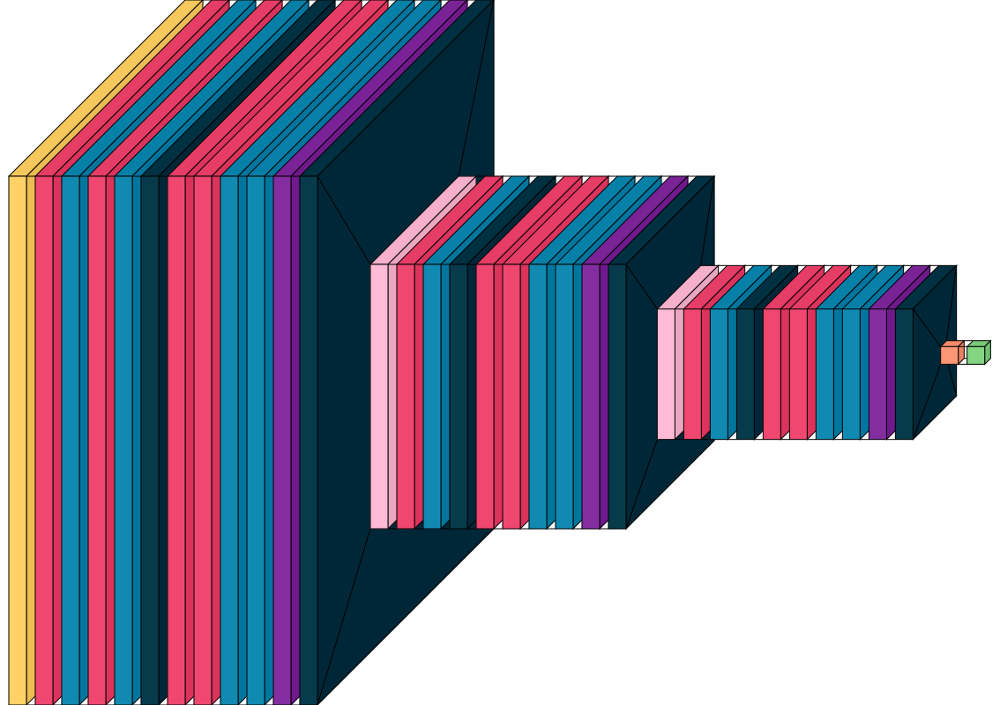

In [59]:
visualkeras.layered_view(residual_model)

In [60]:
# Entrenamos el modelo
history = residual_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks = [early_stopping]
)

Epoch 1/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 62s 135ms/step - accuracy: 0.6194 - loss: 0.9922 - val_accuracy: 0.4266 - val_loss: 2.1513
Epoch 2/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - accuracy: 0.7819 - loss: 0.6186 - val_accuracy: 0.4914 - val_loss: 1.3104
Epoch 3/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - accuracy: 0.8109 - loss: 0.5348 - val_accuracy: 0.6825 - val_loss: 0.8930
Epoch 4/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - accuracy: 0.8308 - loss: 0.4718 - val_accuracy: 0.7427 - val_loss: 0.6355
Epoch 5/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - accuracy: 0.8436 - loss: 0.4345 - val_accuracy: 0.8193 - val_loss: 0.5102
Epoch 6/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - accuracy: 0.8537 - loss: 0.4028 - val_accuracy: 0.7274 - val_loss: 0.7637
Epoch 7/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - accuracy: 0.8594 - loss: 0.3813 - val_accuracy: 0.8225 - val_loss: 0.4832
Epoch 8/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - accuracy: 0.8704 - loss: 

### Evaluacion del modelo

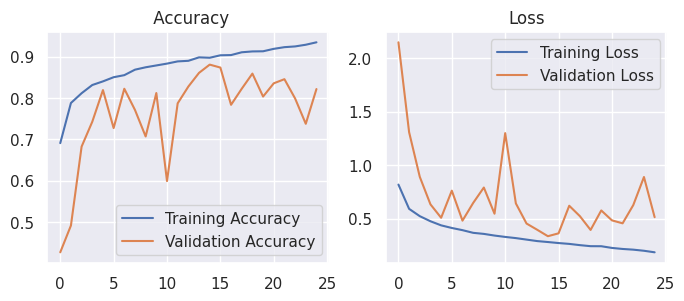

In [61]:
graficar_entrenamiento(history)

In [326]:
evaluar_test(residual_model, test_ds)

94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.8716 - loss: 0.4234
  Conjunto      Loss  Accuracy
0     Test  0.379984  0.878333


**Comparación de métricas train y test:** El desempeño del modelo es muy bueno, con aproximadamente un 88% de precisión en test y una precision de 95% en train. La perdida esde 0.38 en test y 0.18 en train
**Evolución de la perdida y precisión:** Las métricas evolucionaron sin problemas, en train es más suave y en validación se presenta un ruido que parece empezar a disminuir con el avance de las épocas.

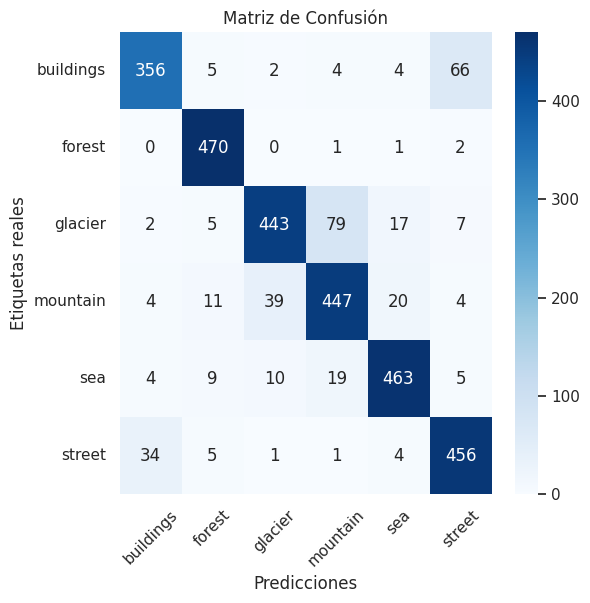

In [63]:
graficar_confusion_matrix(test_ds, residual_model)

La matriz de confusion muestra que clasifica muy bien pero las clases building y street, y glacier y mountain son las que presentan mayores casos de predicciones erroneas.

In [182]:
guardar_errores_prediccion(residual_model, class_names, test_ds,\
                           carpeta_errores="residual_imagenes",\
                           archivo_csv="errores_residual_model.csv")



Se guardaron 365 imágenes con errores en 'residual_imagenes' y los datos en 'errores_residual_model.csv'.


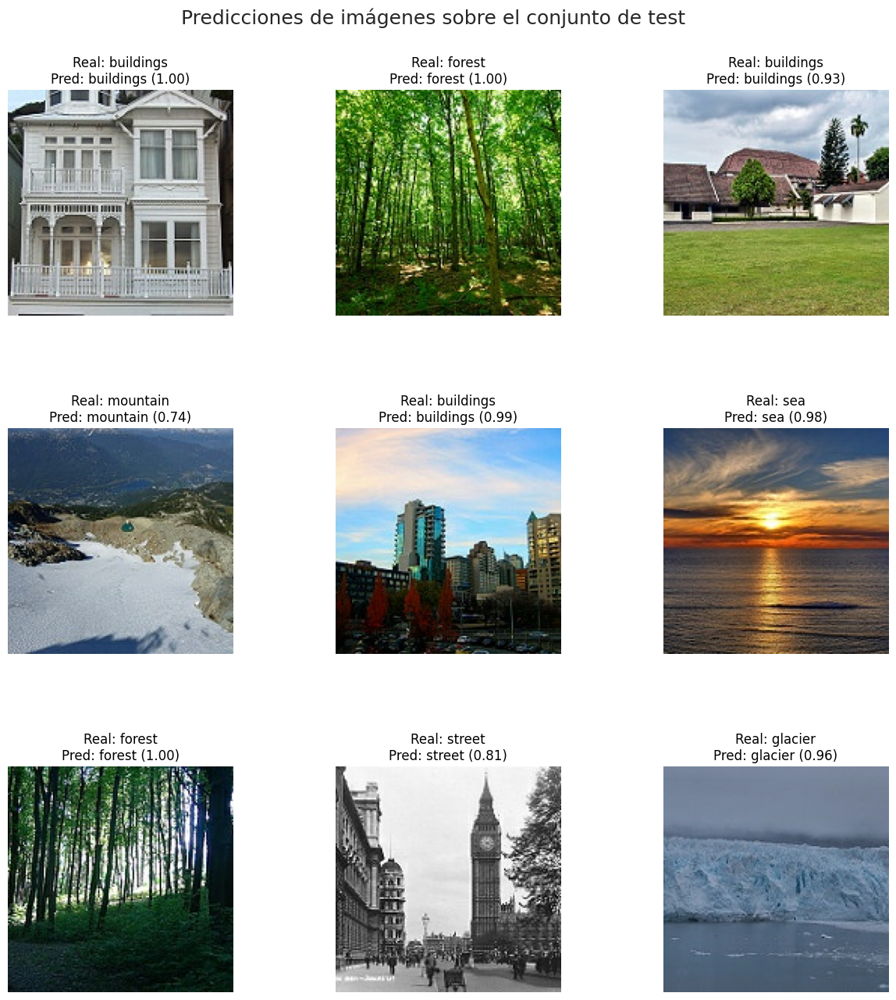

In [65]:
visualizar_imagenes_predicciones(residual_model, class_names, test_ds, show_pred_only=False)

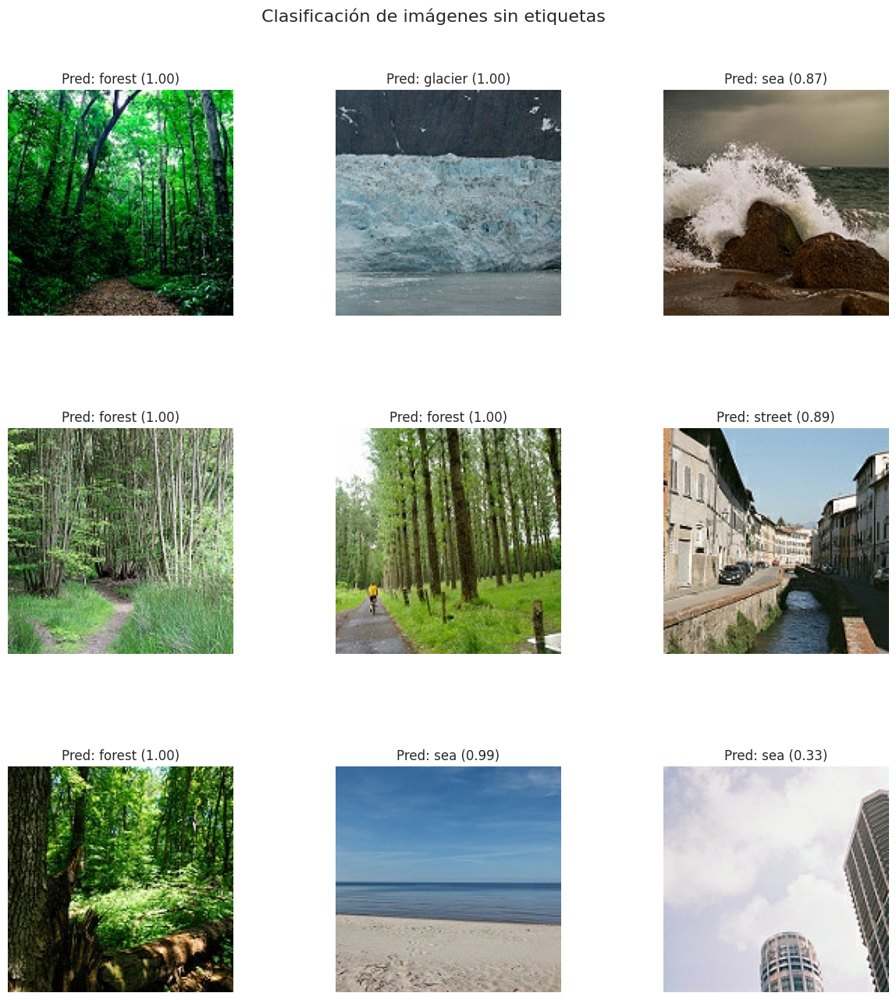

In [66]:
clasificar_imagenes(residual_model, class_names, pred_ds)

### Modelo con Transfer learning

In [67]:
def build_transfer_model(input_shape, num_classes):
    base_model = tf.keras.applications.EfficientNetB0(input_shape=input_shape,
                                                include_top=False,
                                                weights='imagenet')
    base_model.trainable = False

    i = Input(shape=input_shape)

    x = Rescaling(1./255)(i)
    x = RandomFlip("horizontal")(x)
    x = RandomFlip("vertical")(x)
    x = RandomTranslation(0.1, 0.1, fill_mode="reflect")(x)
    x = RandomContrast(0.2)(x)

    x = base_model(i, training=False)
    x = GlobalMaxPooling2D()(x)
    x = Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(i, x)


**Estructura del modelo:**
- EfficientNetB0 se carga con pesos preentrenados en ImageNet, permitiendo que el modelo tenga un conocimiento previo sobre características generales de imágenes.
- include_top=False: elimina la última capa de clasificación de ImageNet, permitiendo que agregar la salida personalizada.
- base_model.trainable = False: congela los pesos de EfficientNet, evitando que se modifiquen en las primeras fases del entrenamiento
- x = base_model(i, training=False):
 EfficientNetB0 procesa la imagen y extrae características profundas, como bordes, texturas y formas, sin modificar los pesos preentrenados (porque training=False).
- x = GlobalMaxPooling2D()(x):
Transforma el mapa de características en un vector más compacto, reduciendo la cantidad de parámetros y evitando sobreajuste.
- Última capa Dense(num_classes, activation='softmax') genera probabilidades para cada clase.






In [68]:
def build_transfer_model1(input_shape, num_classes):
    base_model = tf.keras.applications.MobileNetV3Large(input_shape=input_shape,
                                                include_top=False,
                                                weights='imagenet')

    base_model.trainable = False
    i = Input(shape=input_shape)

    x = base_model(i, training=False)

    x = GlobalMaxPooling2D()(x)
    x = Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(i, x)

In [69]:
transfer_model = build_transfer_model((IMAGE_HEIGHT, IMAGE_WIDTH, 3), num_classes)

transfer_model.compile(
    optimizer='adam',
    loss="categorical_crossentropy",
    metrics=['accuracy'])

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [70]:
transfer_model1 = build_transfer_model1((IMAGE_HEIGHT, IMAGE_WIDTH, 3), num_classes)

transfer_model1.compile(
    optimizer='adam',
    loss="categorical_crossentropy",
    metrics=['accuracy'])

12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [71]:
transfer_model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 5, 5, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling2d            │ (None, 1280)           │             0 │
│ (GlobalMaxPooling2D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 6)              │         7,686 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,057,257 (15.48 MB)

 Trainable params: 7,686 (30.02 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

La cantidad de parametros entrenables es de 4057257 , muy por encima del modelo residual

In [72]:
transfer_model1.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNetV3Large (Functional)   │ (None, 5, 5, 960)      │     2,996,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling2d_1          │ (None, 960)            │             0 │
│ (GlobalMaxPooling2D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 6)              │         5,766 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,002,118 (11.45 MB)

 Trainable params: 5,766 (22.52 KB)

 Non-trainable params: 2,996,352 (11.43 MB)

In [252]:
EPOCHS = 200

In [73]:
# Entrena el modelo
history_EfficientNetB0 = transfer_model.fit(
                         train_ds,
                         validation_data=val_ds,
                         epochs=EPOCHS,
                         batch_size=BATCH_SIZE,
                         callbacks=[early_stopping]
                        )

Epoch 1/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - accuracy: 0.7458 - loss: 0.8231 - val_accuracy: 0.8803 - val_loss: 0.3387
Epoch 2/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.8939 - loss: 0.3030 - val_accuracy: 0.8931 - val_loss: 0.3155
Epoch 3/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.9108 - loss: 0.2598 - val_accuracy: 0.9024 - val_loss: 0.2995
Epoch 4/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.9190 - loss: 0.2143 - val_accuracy: 0.8981 - val_loss: 0.3181
Epoch 5/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.9261 - loss: 0.2024 - val_accuracy: 0.9048 - val_loss: 0.2985
Epoch 6/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.9312 - loss: 0.1836 - val_accuracy: 0.9130 - val_loss: 0.2885
Epoch 7/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.9399 - loss: 0.1654 - val_accuracy: 0.8892 - val_loss: 0.3788
Epoch 8/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.9365 - loss: 0.1782 -

In [74]:
history_MobileNetV3Large = transfer_model1.fit(
                           train_ds,
                           validation_data=val_ds,
                           epochs=EPOCHS,
                           batch_size=BATCH_SIZE,
                           callbacks=[early_stopping]
                          )

Epoch 1/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 28s 51ms/step - accuracy: 0.6980 - loss: 2.1801 - val_accuracy: 0.8614 - val_loss: 0.7384
Epoch 2/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.8844 - loss: 0.5845 - val_accuracy: 0.8692 - val_loss: 0.7254
Epoch 3/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.8926 - loss: 0.4648 - val_accuracy: 0.8920 - val_loss: 0.5665
Epoch 4/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9088 - loss: 0.3757 - val_accuracy: 0.8795 - val_loss: 0.5909
Epoch 5/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9278 - loss: 0.2649 - val_accuracy: 0.8870 - val_loss: 0.5885
Epoch 6/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9337 - loss: 0.2270 - val_accuracy: 0.8835 - val_loss: 0.5701
Epoch 7/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9357 - loss: 0.2061 - val_accuracy: 0.8820 - val_loss: 0.6145
Epoch 8/200
351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9358 - loss: 0.2081 -

### Evaluacion del modelo

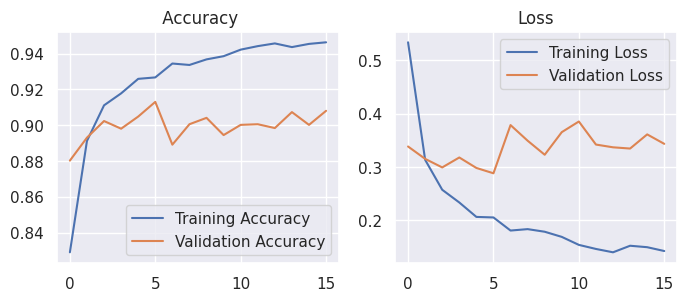

In [75]:
graficar_entrenamiento(history_EfficientNetB0)

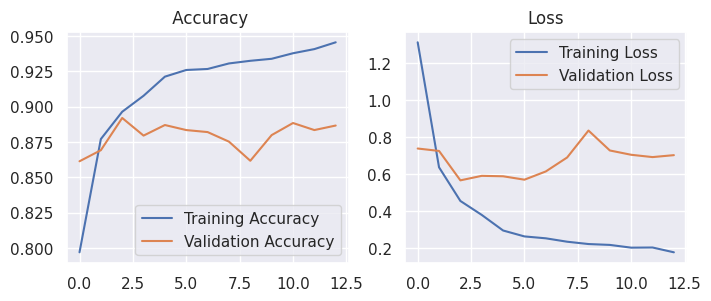

In [76]:
graficar_entrenamiento(history_MobileNetV3Large)

In [327]:
evaluar_test(transfer_model, test_ds)

94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.8955 - loss: 0.3313
  Conjunto      Loss  Accuracy
0     Test  0.343721     0.893


In [328]:
evaluar_test(transfer_model1, test_ds)

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8640 - loss: 0.7354
  Conjunto      Loss  Accuracy
0     Test  0.698831     0.874


EfficientNetB0 y MobileNetV3Large son dos arquitecturas de redes neuronales diseñadas para tareas de clasificación de imágenes.

**MobileNetV3Large**: está diseñado para ser ligero y rápido, ideal para aplicaciones en dispositivos con recursos limitados.

**EfficientNetB0**: tiene mayor precisión en comparación con MobileNetV3Large y es más costoso en términos computacionales, pero eficiente en escalado.








Decidimos elegir EfficientNetB0 ya que privilegiamos la  precisión pero minimizando el costo y no requiere para este conjunto de datos una capacidad computacional elevada.,


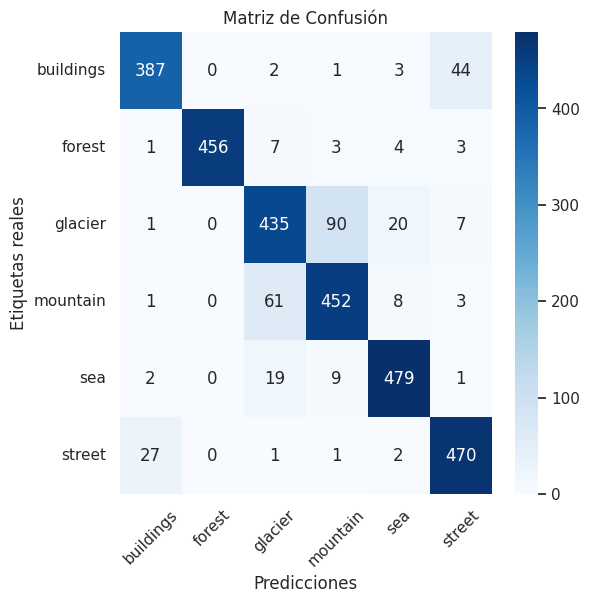

In [79]:
graficar_confusion_matrix(test_ds, transfer_model)

**Comparación de métricas train y test:** Este modelo fue el que mejor desempeño tuvo, y sigue habiendo un ligero sobreajuste.
**Evolución de la perdida y precisión:** Tanto la perdida y la precisión evolucionaron establemente durante el entrenamiento, destacando, que en el conjunto de validación fueron más estables que en los modelos anteriores.
** Matriz de confusión: **En este caso la detección de clases fue bastante alta tambien, las clases que tuvieron más problemas 'glacier' y 'mountain'.

In [183]:
guardar_errores_prediccion(transfer_model, class_names, test_ds,\
                           carpeta_errores="transfer_imagenes",\
                           archivo_csv="errores_transfer_model.csv")


Se guardaron 321 imágenes con errores en 'transfer_imagenes' y los datos en 'errores_transfer_model.csv'.


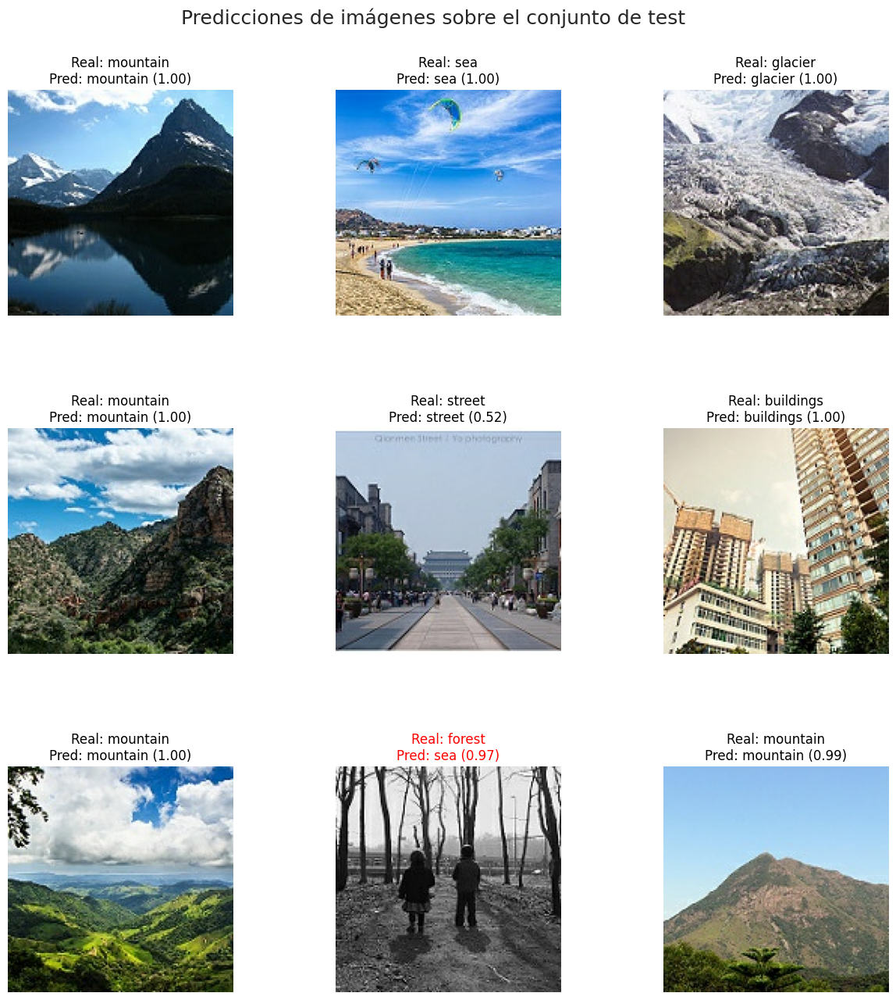

In [81]:
visualizar_imagenes_predicciones(transfer_model, class_names, test_ds, show_pred_only=False)

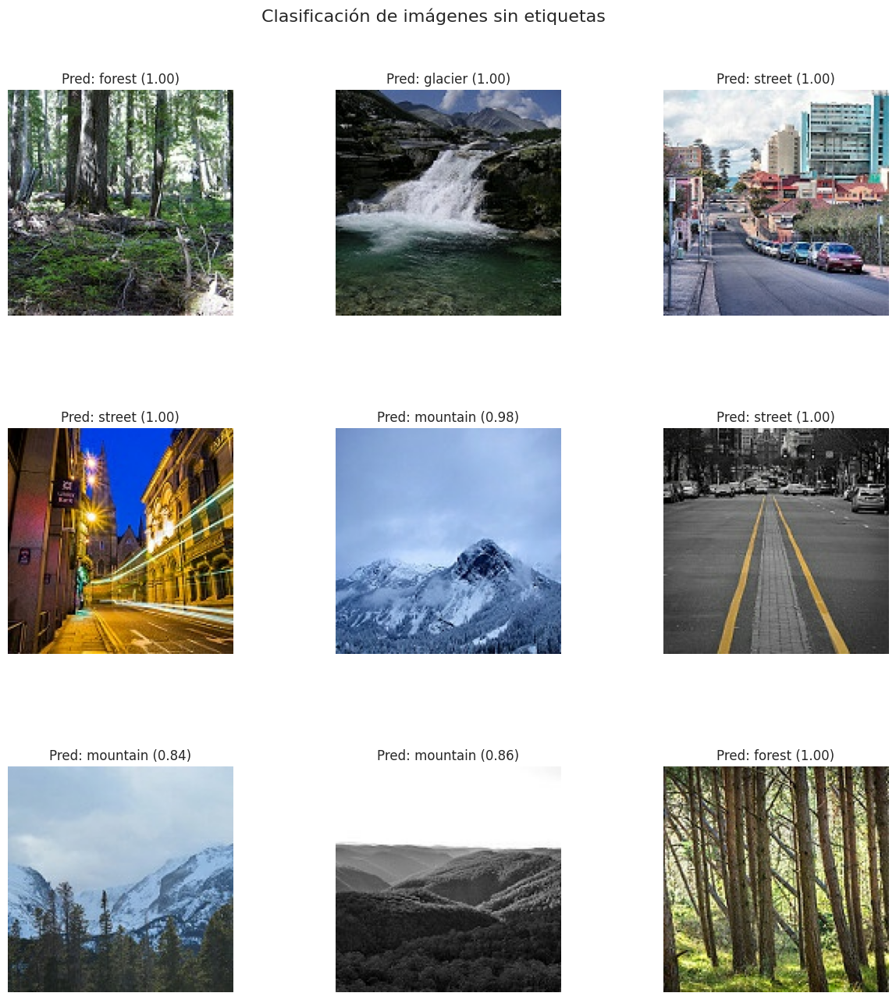

In [82]:
clasificar_imagenes(transfer_model, class_names, pred_ds)

## **Analísis de las imágenes con predicciones erroneas**

En esta sección analizamos un ejemplo de las imágenes, guardadas previamente, junto a una archivo csv con los datos de predicciones erroneas, por modelo.

In [299]:
df_dense = pd.read_csv("dense_errores.csv")
df_cnn = pd.read_csv("errores_cnn_model.csv")
df_residual = pd.read_csv("errores_residual_model.csv")
df_transfer = pd.read_csv("errores_transfer_model.csv")

In [300]:
df_dense.head(5)

,indice_imagen,ruta_imagen,etiqueta_real,etiqueta_predicha
0,0,dense_imagenes/error_0_mountain_vs_glacier.png,mountain,glacier
1,3,dense_imagenes/error_3_sea_vs_glacier.png,sea,glacier
2,4,dense_imagenes/error_4_glacier_vs_sea.png,glacier,sea
3,5,dense_imagenes/error_5_mountain_vs_glacier.png,mountain,glacier
4,7,dense_imagenes/error_7_buildings_vs_glacier.png,buildings,glacier


Modelo de capas densas


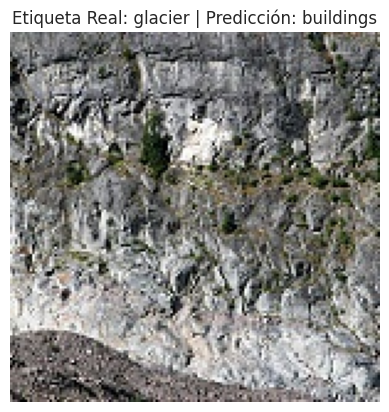

In [317]:
indice_busqueda = 1459
print("Modelo de capas densas")
visualizar_imagenes_erroneas(indice_busqueda,df_dense)

La imagen no pertenece a ninguna clase, o estaria mal etiquetada.


In [188]:
df_cnn.head(5)

,indice_imagen,ruta_imagen,etiqueta_real,etiqueta_predicha
0,2,cnn_imagenes/error_2_mountain_vs_glacier.png,mountain,glacier
1,3,cnn_imagenes/error_3_street_vs_forest.png,street,forest
2,4,cnn_imagenes/error_4_glacier_vs_sea.png,glacier,sea
3,18,cnn_imagenes/error_18_sea_vs_glacier.png,sea,glacier
4,24,cnn_imagenes/error_24_buildings_vs_sea.png,buildings,sea


Modelo de capas convolucionales


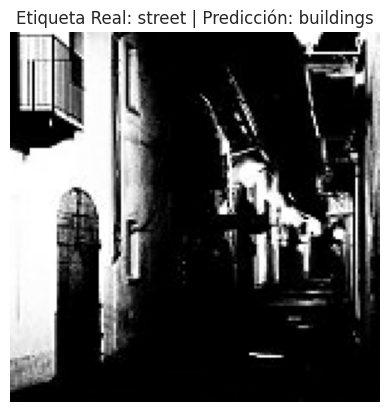

In [247]:
indice_busqueda = 24
print("Modelo de capas convolucionales")
visualizar_imagenes_erroneas(indice_busqueda,df_cnn)

 Una imagen oscura puede dificultar la detección de patrones, especialmente si los objetos son difíciles de distinguir del fondo


In [190]:
df_residual.head(5)

,indice_imagen,ruta_imagen,etiqueta_real,etiqueta_predicha
0,5,residual_imagenes/error_5_glacier_vs_sea.png,glacier,sea
1,7,residual_imagenes/error_7_glacier_vs_mountain.png,glacier,mountain
2,8,residual_imagenes/error_8_street_vs_forest.png,street,forest
3,13,residual_imagenes/error_13_mountain_vs_glacier...,mountain,glacier
4,14,residual_imagenes/error_14_mountain_vs_glacier...,mountain,glacier


Modelo de bloques residuales


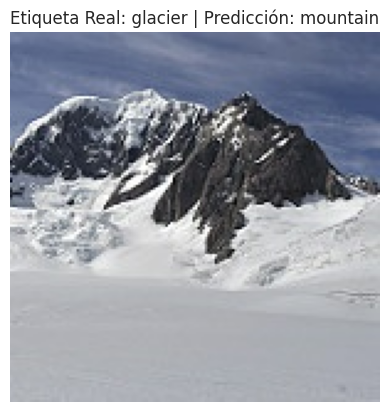

In [246]:
indice_busqueda = 14
print("Modelo de bloques residuales")
visualizar_imagenes_erroneas(indice_busqueda,df_residual)

La imagen puede corresponder tanto a una montaña nevada como a un glaciar

In [215]:
df_transfer.head(5)

,indice_imagen,ruta_imagen,etiqueta_real,etiqueta_predicha
0,9,transfer_imagenes/error_9_glacier_vs_mountain.png,glacier,mountain
1,14,transfer_imagenes/error_14_mountain_vs_glacier...,mountain,glacier
2,15,transfer_imagenes/error_15_buildings_vs_street...,buildings,street
3,25,transfer_imagenes/error_25_mountain_vs_glacier...,mountain,glacier
4,10,transfer_imagenes/error_10_mountain_vs_glacier...,mountain,glacier


Modelo  de transfer learning


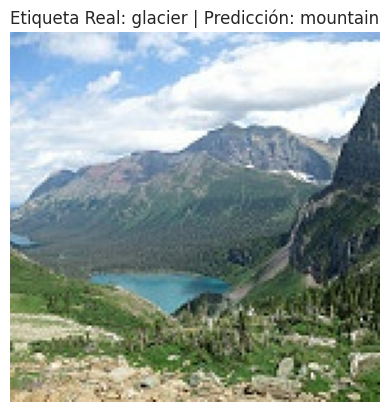

In [248]:
indice_busqueda = 9
print("Modelo  de transfer learning")
visualizar_imagenes_erroneas(indice_busqueda,df_transfer)

En este caso podemos observar que el modelo predijo bien, la imagen está mal etiquetada.

 Para minimizar aun mas el error en los modelos podríamos aplicar:

*    Preprocesamiento de imágenes al conjunto de test : Aumentar el brillo y contraste antes de la predicción si la iluminacion es baja o por el contrario hacer uso de técnicas de balance de color: Aplicar filtros que reduzcan el impacto de la luz intensa.

*     Entrenamiento robusto: Asegurar que el modelo haya sido entrenado con imágenes variadas (incluyendo en blanco y negro y con diferentes iluminaciones).

*   Verificar el etiquetado del conjunto de train y test.






# **Conclusion**

Se probaron diversas arquitecturas para abordar la tarea de clasificación de imágenes.
Utilizando el modelo de redes densas, no se logró superar una accuracy del 51% en testeo. Esto se debe a que este tipo de arquitecturas no están diseñadas para capturar relaciones espaciales en las imágenes. Al tratar cada píxel de forma individual, las redes densas pierden la información estructural que es fundamental en tareas de clasificación de imágenes.

Una CNN (Convolutional Neural Network) es un tipo de red neuronal diseñada para el análisis de imágenes. Su principal ventaja es que detecta patrones visuales como bordes, texturas y formas mediante capas convolucionales.


  Los modelos convolucional y con bloques residuales lograron un desempeño aceptable mediante arquitecturas relativamente simples. Finalmente, el modelo con un backbone preentrenado fue el que obtuvo los mejores resultados, demostrando que, en este caso, no fue necesario construir una arquitectura compleja para lograr una buena precisión.

Cabe destacar que estos modelos podrían mejorar sus resultados con ajustes adicionales y, potencialmente, con un dataset más amplio, lo que permitiría un mejor aprendizaje de patrones en clases similares que no fueron bien clasificadas, como 'mountain', 'glacier', 'street' y 'buildings'. Esto sugiere que una mayor cantidad de datos podría ayudar a distinguir mejor las características entre estas clases.